In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from skimage.transform import resize
from skimage.filters import gaussian
from skimage import io, util

In [2]:
def get_image(image_path):
    img = Image.open(image_path)
    img_array = np.array(img)
    return img_array

def print_image(img):
    plt.imshow(img)
    plt.title("Image Visualization")
    plt.axis('on') 
    plt.show()

def print_images(img1, img2):
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title("Original Image")
    plt.axis('on')
    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title("New Image")
    plt.axis('on')
    plt.show()

    
def print_imagess(img1, img2, img3, titles=True):
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img1)
    if titles:
        plt.title("Average Image")
    plt.subplot(1, 3, 2)
    plt.imshow(img2)
    if titles:
        plt.title("Original Image")
    plt.subplot(1, 3, 3)
    plt.imshow(img3)
    if titles:
        plt.title("CRH")
    plt.show()
    
def crh(votes, iterations):
    nq, nv, nm = v.shape
    
    y = np.mean(v,1)
    
    for iteration in range(iterations):
        s = np.tile(np.std(v,1)[:,np.newaxis,:],(1,nv,1))
        if np.sum(s==0)>0:
            temp = np.copy(s)
            temp[s==0] += 1
            s[s==0] = np.min(temp)
        d = ((v-np.tile(y[:,np.newaxis,:],(1,nv,1)))**2)/s
        c = np.sum(d)
        trust = -np.log(np.sum(np.sum(d,2),0)/c)
        y = np.sum(np.tile(trust[np.newaxis,:,np.newaxis], (nq, 1, nm))*v,1)/np.sum(trust)
    
    return y, trust

def radial_gradient(shape, center, radius):
    x, y = np.ogrid[:shape[0], :shape[1]]
    distance = np.sqrt((x - center[0]) ** 2 + (y - center[1]) ** 2)
    gradient = 1 - np.clip(distance / radius, 0, 1)
    return gradient

def add_stains(pic, n_stains, max_radius, colorful=False):
    img = np.copy(pic)
    for _ in range(n_stains):
        if colorful:
            color = np.random.rand(3)
        else:
            color = np.array([1,1,1])
        x, y = np.random.randint(0, img.shape[0]), np.random.randint(0, img.shape[1])
        gradient = radial_gradient(img.shape[:2], center=(x, y), radius=np.random.randint(1, max_radius))
        img[:, :, :] += (color * gradient[:, :, np.newaxis])
    return img

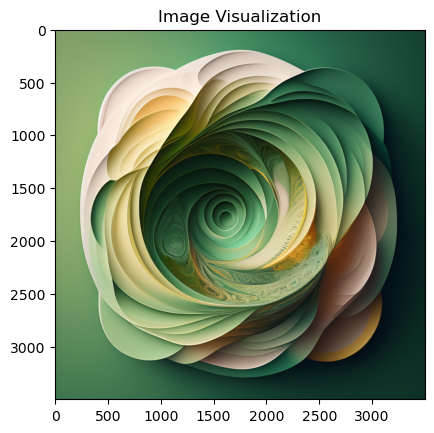

In [3]:
image_path = 'pic2.jpg'
pic = get_image(image_path)
print_image(pic)

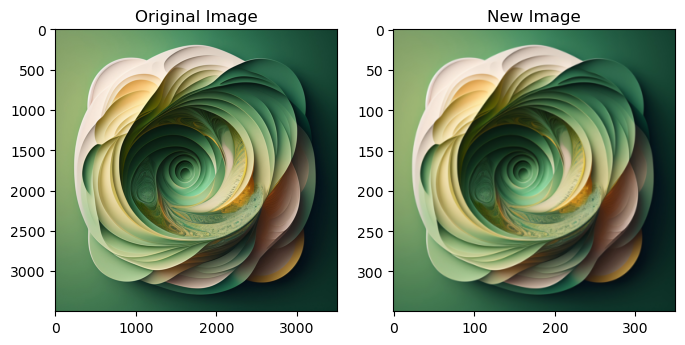

In [4]:
pic1 = resize(pic, (350,350,3), anti_aliasing=True)
print_images(pic, pic1)

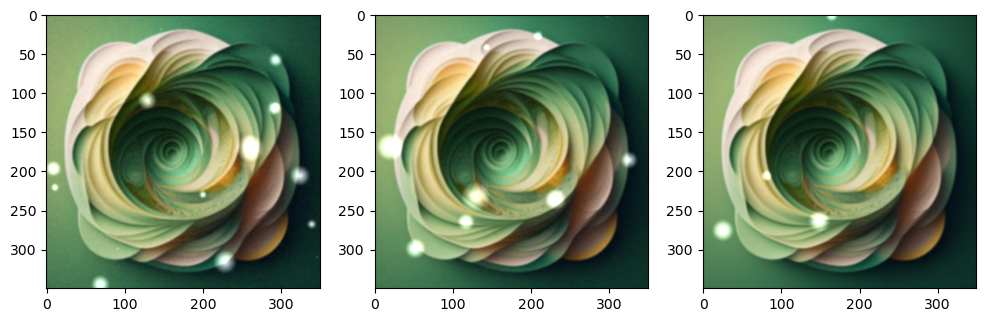

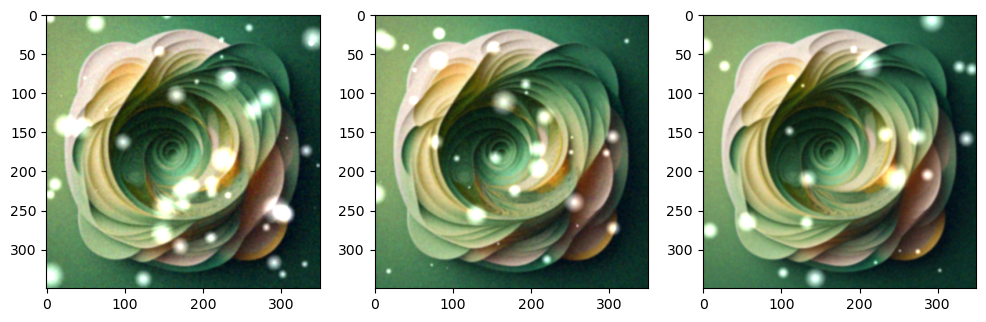

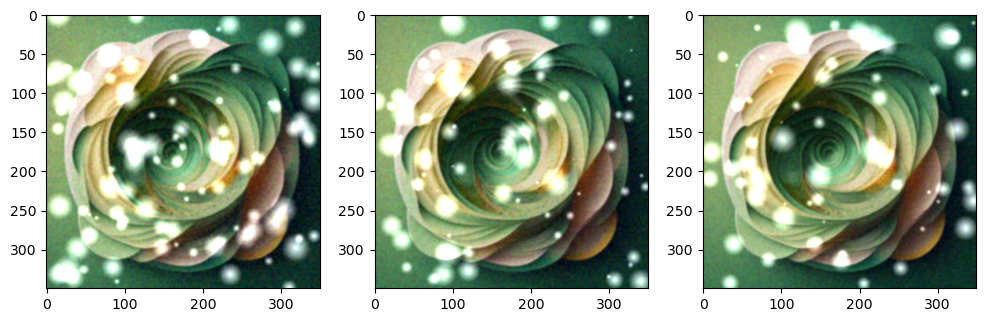

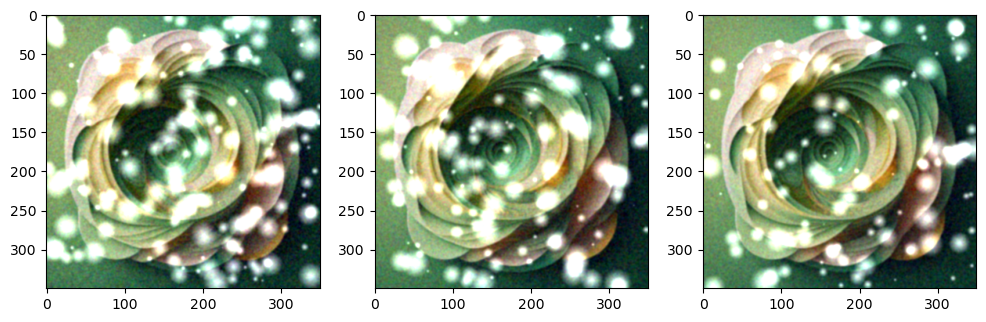

(122500, 12, 3)

In [5]:
v = []
nv = pic1.shape[0]*pic1.shape[1]
for i in range(12):
    noise = np.random.normal(loc=0, scale=(i+1)/100, size=pic1.shape)
    pic2 = pic1 + noise
    k = (i+2)**2
    pic3 = add_stains(pic2,k,20)
    pic3 = gaussian(pic3, sigma=1,channel_axis=-1)
    pic3 = np.clip(pic3, 0, 1)
    v.append(pic3.reshape(nv,3))
    if (i+1)%3 == 0:
        print_imagess(v[i].reshape(pic1.shape), v[i-1].reshape(pic1.shape), v[i-2].reshape(pic1.shape), titles=False)
v = np.array(v)
v = np.transpose(v,(1,0,2))
v.shape

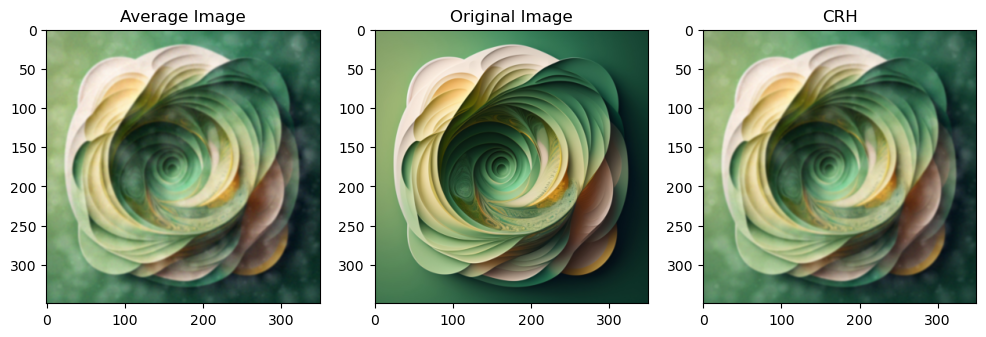

CRH error:  0.04912695715249566  ; AVG error:  0.06312719650351485


In [8]:
y, b = crh(v, 10)
avg_img = np.mean(v,1).reshape(pic1.shape)
print_imagess(avg_img, pic1, y.reshape(pic1.shape))
e_crh = np.mean(np.abs(pic1-y.reshape(pic1.shape)))
e_avg = np.mean(np.abs(avg_img-pic1))
print('CRH error: ', e_crh, ' ; AVG error: ', e_avg)

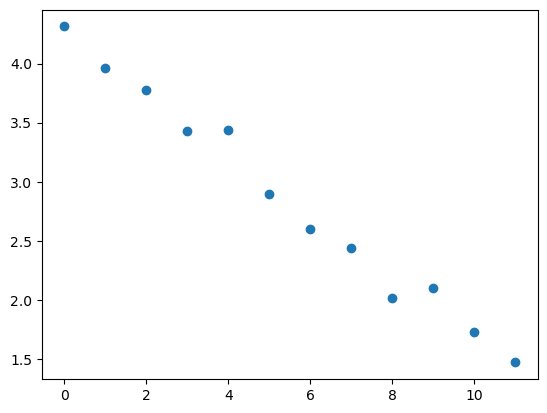

In [9]:
plt.plot(b,'o')
plt.show()

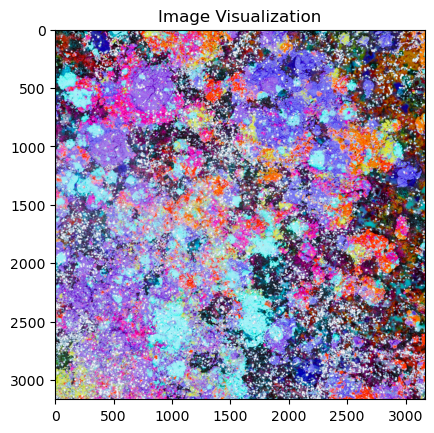

In [224]:
image_path = 'pic3.jpg'
pic = get_image(image_path)
print_image(pic)

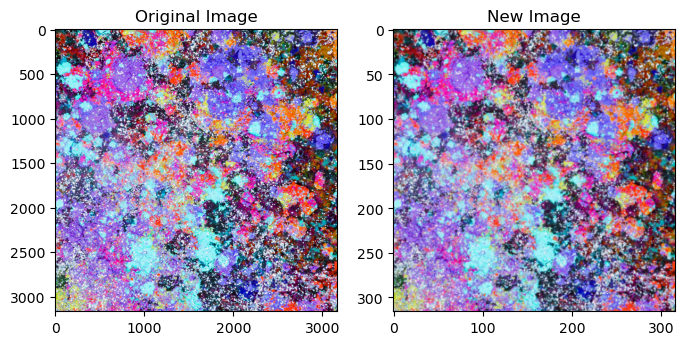

In [225]:
pic1 = resize(pic, (pic.shape[0]//10,pic.shape[1]//10,3), anti_aliasing=True)
print_images(pic, pic1)

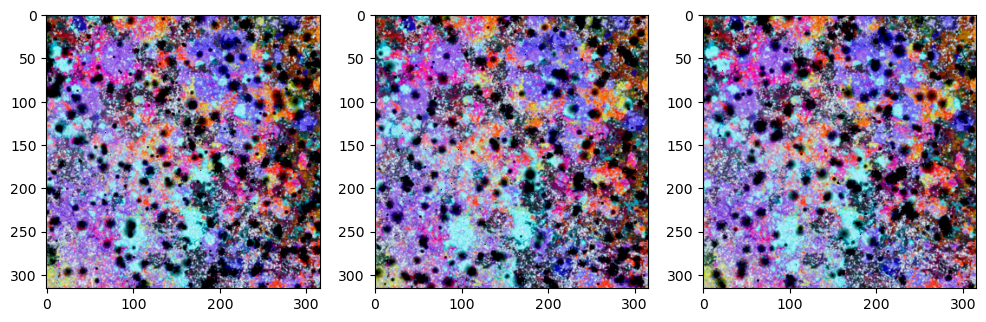

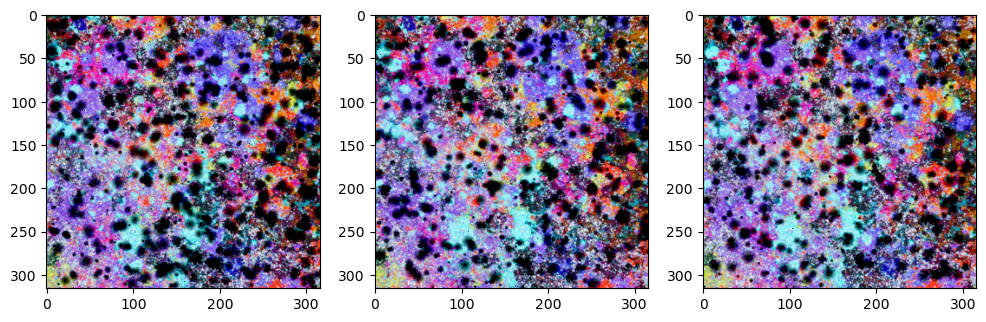

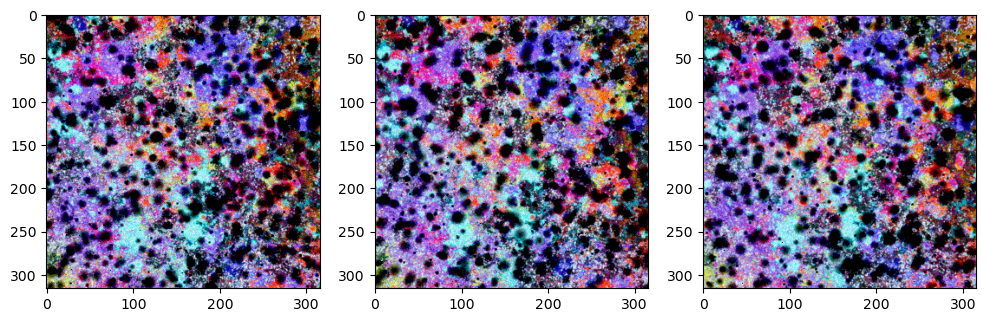

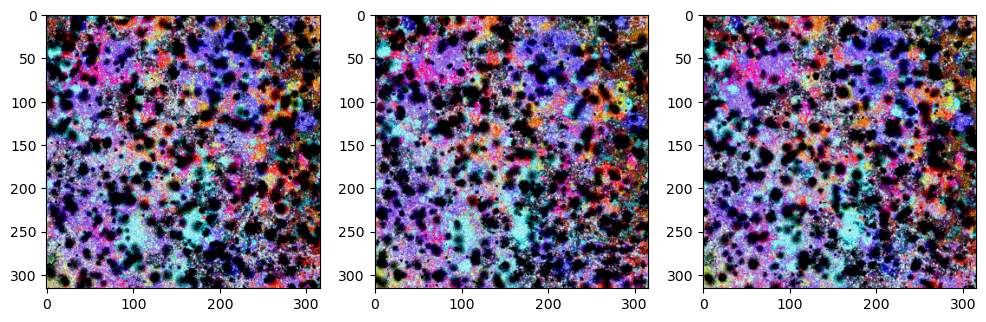

(99856, 12, 3)

In [243]:
v = []
nv = pic1.shape[0]*pic1.shape[1]
for i in range(12):
    noise = np.random.normal(loc=0, scale=(i+1)/100, size=pic1.shape)
    pic2 = pic1 + noise
    k = 240+50*i
    pic3 = add_stains(pic2,k,10)
    #pic3 = gaussian(pic3, sigma=1,channel_axis=-1)
    pic3 = np.clip(pic3, 0, 1)
    v.append(pic3.reshape(nv,3))
    if (i+1)%3 == 0:
        print_imagess(v[i].reshape(pic1.shape), v[i-1].reshape(pic1.shape), v[i-2].reshape(pic1.shape), titles=False)
v = np.array(v)
v = np.transpose(v,(1,0,2))
v.shape

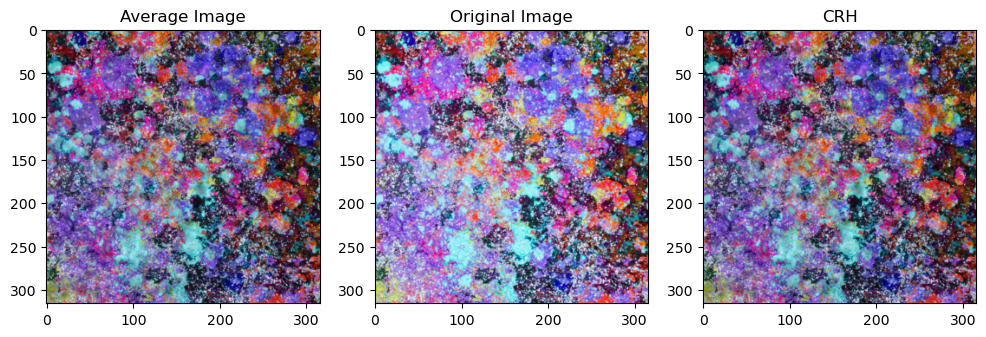

CRH error:  0.11773547300341587  ; AVG error:  0.12135329293705306


In [249]:
y, b = crh(v, 1)
avg_img = np.mean(v,1).reshape(pic1.shape)
print_imagess(avg_img, pic1, y.reshape(pic1.shape))
e_crh = np.mean(np.abs(pic1-y.reshape(pic1.shape)))
e_avg = np.mean(np.abs(avg_img-pic1))
print('CRH error: ', e_crh, ' ; AVG error: ', e_avg)

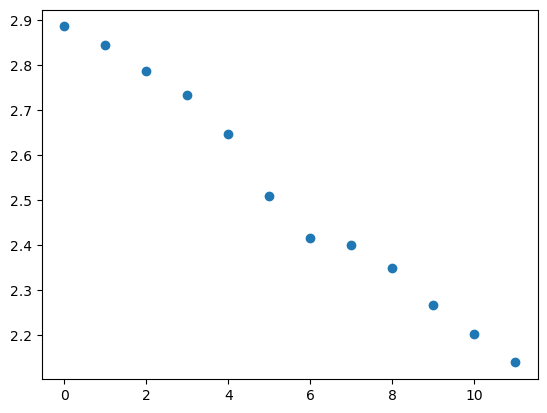

In [250]:
plt.plot(b,'o')
plt.show()

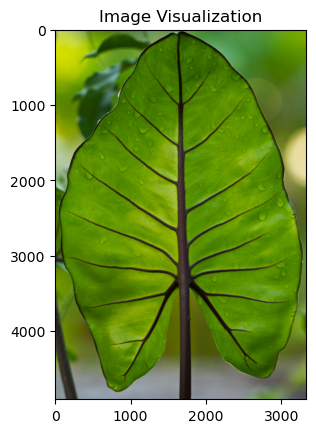

In [251]:
image_path = 'pic1.jpg'
pic = get_image(image_path)
print_image(pic)

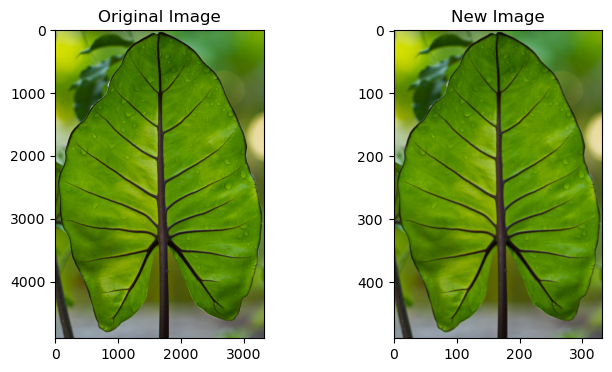

In [252]:
pic1 = resize(pic, (pic.shape[0]//10,pic.shape[1]//10,3), anti_aliasing=True)
print_images(pic, pic1)

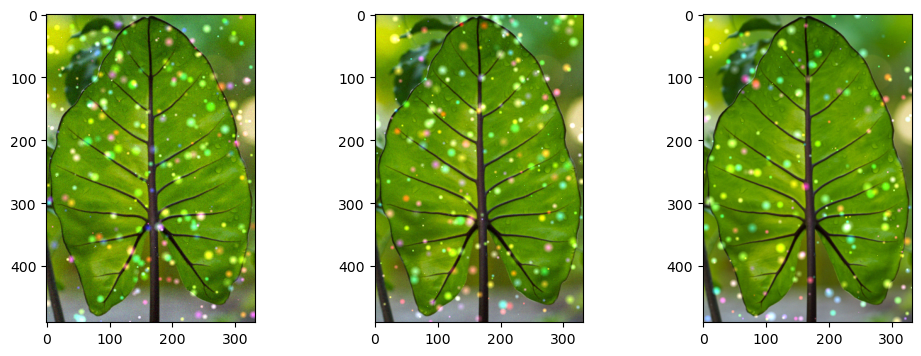

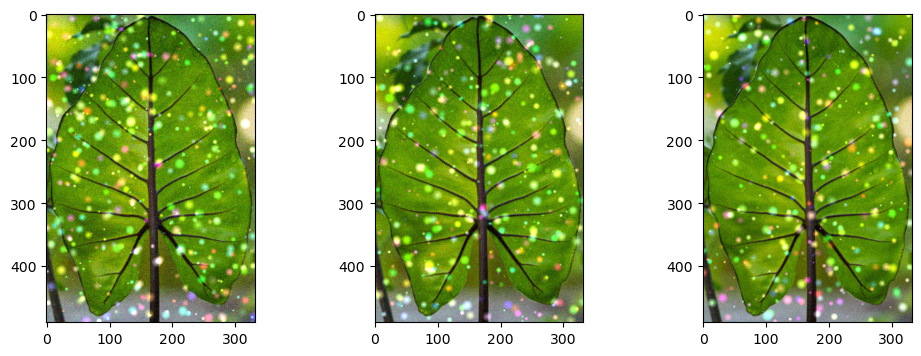

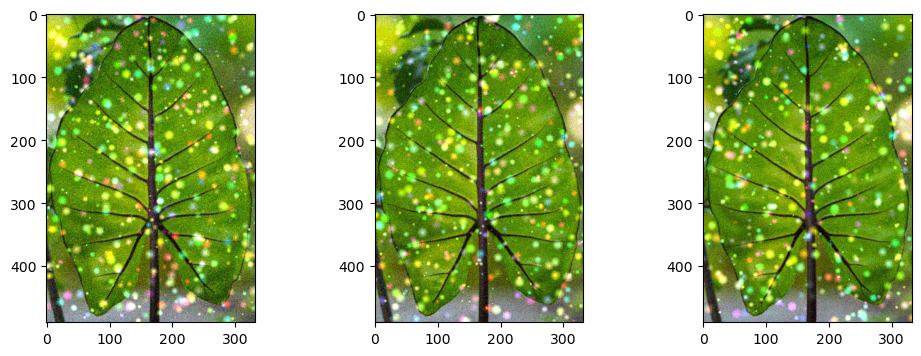

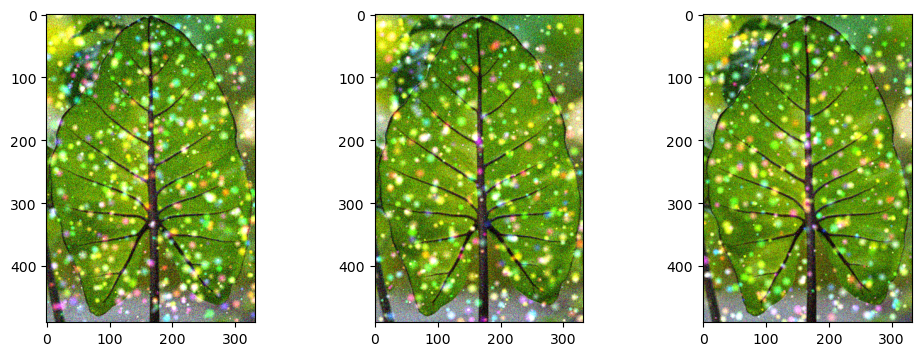

(162680, 12, 3)

In [257]:
v = []
nv = pic1.shape[0]*pic1.shape[1]
for i in range(12):
    noise = np.random.normal(loc=0, scale=(i+1)/100, size=pic1.shape)
    pic2 = pic1 + noise
    k = 240+50*i
    pic3 = add_stains(pic2,k,10, colorful=True)
    #pic3 = gaussian(pic3, sigma=1,channel_axis=-1)
    pic3 = np.clip(pic3, 0, 1)
    v.append(pic3.reshape(nv,3))
    if (i+1)%3 == 0:
        print_imagess(v[i].reshape(pic1.shape), v[i-1].reshape(pic1.shape), v[i-2].reshape(pic1.shape), titles=False)
v = np.array(v)
v = np.transpose(v,(1,0,2))
v.shape

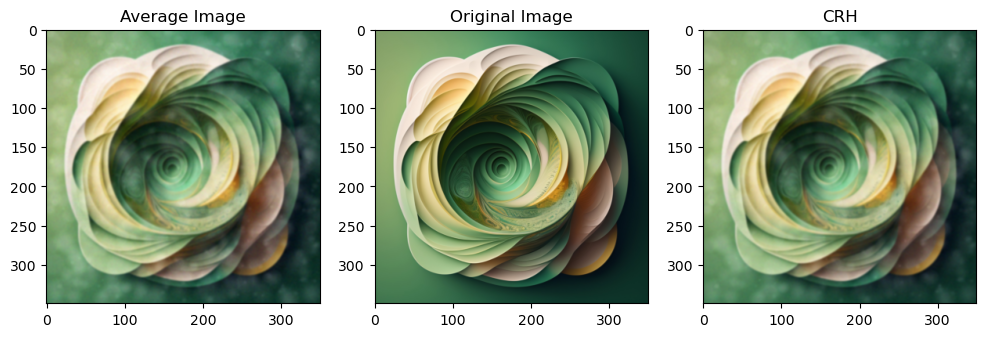

CRH error:  0.051197196453894346  ; AVG error:  0.06312719650351485


In [10]:
y, b = crh(v, 1)
avg_img = np.mean(v,1).reshape(pic1.shape)
print_imagess(avg_img, pic1, y.reshape(pic1.shape))
e_crh = np.mean(np.abs(pic1-y.reshape(pic1.shape)))
e_avg = np.mean(np.abs(avg_img-pic1))
print('CRH error: ', e_crh, ' ; AVG error: ', e_avg)

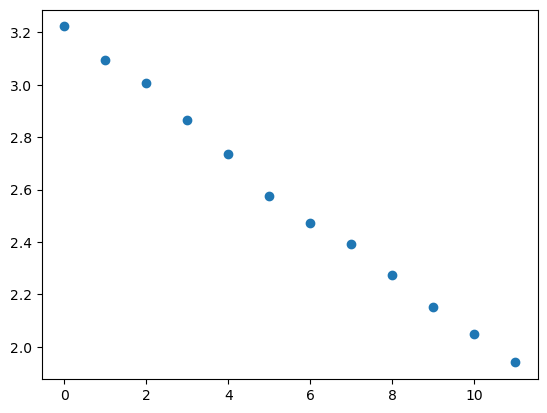

In [261]:
plt.plot(b,'o')
plt.show()